install omx  
conda create -n ox -c conda-forge --strict-channel-priority osmnx  
https://osmnx.readthedocs.io/en/stable/installation.html  
pip install pvlib geopandas shapely matplotlib


In [34]:
import osmnx as ox
import networkx as nx
import folium

# Nombre del lugar
place_name = 'Quilicura, Santiago, Chile'

# Obtener el grafo de la red peatonal
G = ox.graph_from_place(place_name, network_type='walk')

# Coordenadas de origen y destino
origen = (-33.3613, -70.7338)
destino = (-33.3681, -70.7210)

# Encontrar nodos más cercanos
orig_node = ox.distance.nearest_nodes(G, origen[1], origen[0])
dest_node = ox.distance.nearest_nodes(G, destino[1], destino[0])

# Obtener ruta más corta por longitud
ruta = nx.shortest_path(G, orig_node, dest_node, weight='length')

# Crear un mapa centrado en el origen
mapa = folium.Map(location=origen, zoom_start=15)

# Dibujar la ruta en el mapa
ruta_coords = [(G.nodes[n]['y'], G.nodes[n]['x']) for n in ruta]
folium.PolyLine(ruta_coords, color='blue', weight=5, opacity=0.7).add_to(mapa)

# Añadir marcadores en cada nodo de la ruta
for node in ruta:
    lat, lon = G.nodes[node]['y'], G.nodes[node]['x']
    folium.Marker(
        location=(lat, lon),
        popup=f'Node {node}',
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(mapa)

mapa


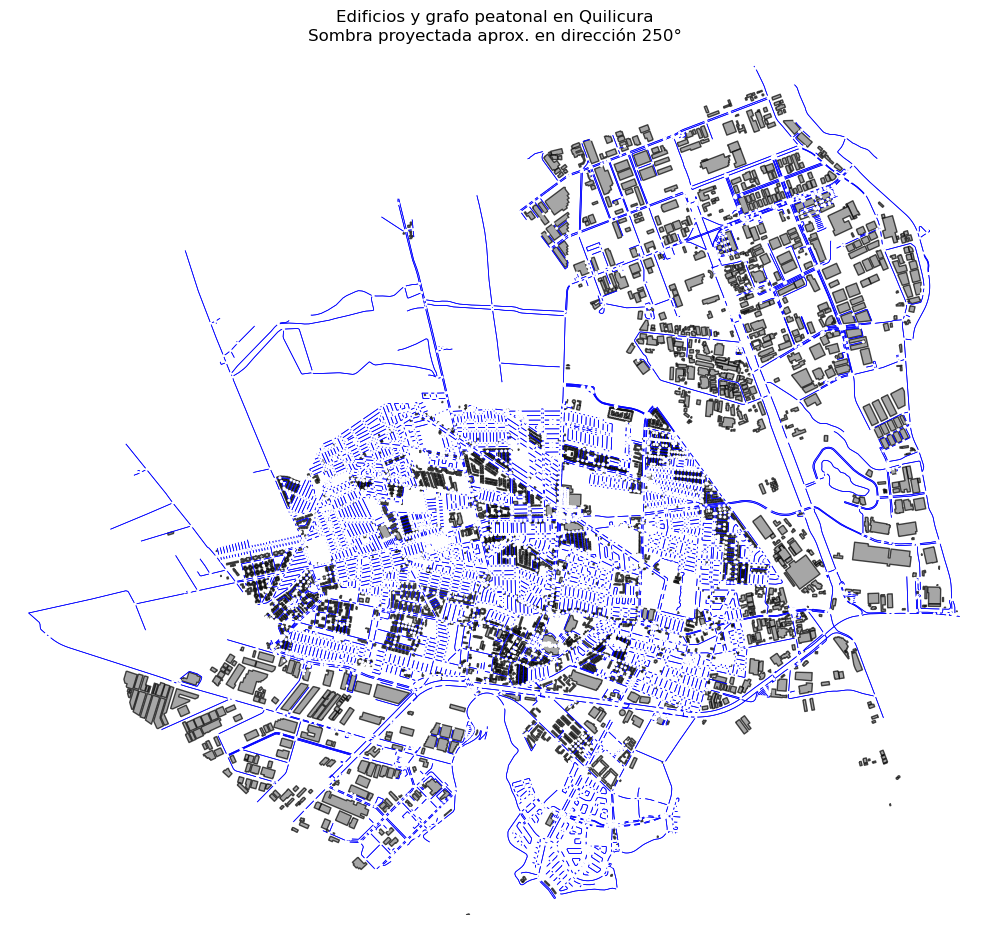

In [36]:
import osmnx as ox
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime
import pvlib
import matplotlib.pyplot as plt

# 1. Definir ubicación
place_name = "Quilicura, Santiago, Chile"

# 2. Obtener grafo peatonal y edificios
G = ox.graph_from_place(place_name, network_type="walk")
buildings = ox.features_from_place(place_name, tags={"building": True})


# 3. Filtrar solo polígonos (algunos datos pueden no tener geometría válida)
buildings = buildings[buildings.geometry.type.isin(["Polygon", "MultiPolygon"])]

# 4. Coordenadas aproximadas del centro
latitude = -33.36
longitude = -70.73

# 5. Hora local simulada (ej: verano a las 15:00)
dt = datetime(2025, 1, 15, 15, 0, 0)

# 6. Posición solar
solpos = pvlib.solarposition.get_solarposition(
    time=dt,
    latitude=latitude,
    longitude=longitude
).iloc[0]

azimuth = solpos.azimuth
shadow_angle = (azimuth + 180) % 360  # dirección de sombra (opuesta al sol)

# 7. Graficar mapa con edificios y grafo
fig, ax = plt.subplots(figsize=(10, 10))
buildings.plot(ax=ax, facecolor="gray", edgecolor="black", alpha=0.7)
ox.plot_graph(G, ax=ax, node_size=5, edge_color="blue", edge_linewidth=0.5, show=False, close=False)

# 8. Título con dirección de sombra
ax.set_title(f"Edificios y grafo peatonal en Quilicura\nSombra proyectada aprox. en dirección {int(shadow_angle)}°")
plt.axis("off")
plt.tight_layout()
plt.show()


In [45]:
import pandas as pd
pd.set_option('display.max_columns', None)
buildings = buildings[buildings.geometry.type.isin(["Polygon", "MultiPolygon"])]

In [37]:
buildings.head() # las alturas de los edificios no están disponibles directamente en OSM, pero podemos estimarlas o usar datos externos si están disponibles.

geometry  \
element  id                                                           
relation 8197614  POLYGON ((-70.7322 -33.36851, -70.73224 -33.36...   
         8593994  POLYGON ((-70.73715 -33.35735, -70.73714 -33.3...   
         8594000  POLYGON ((-70.74565 -33.3577, -70.74552 -33.35...   
         8594001  POLYGON ((-70.74536 -33.35855, -70.74523 -33.3...   
         8594002  POLYGON ((-70.74627 -33.35639, -70.74631 -33.3...   

                 addr:street    building craft        name office source  \
element  id                                                                
relation 8197614         NaN         yes   NaN         NaN    NaN    NaN   
         8593994         NaN      school   NaN         NaN    NaN    NaN   
         8594000         NaN  apartments   NaN  Edificio 1    NaN    NaN   
         8594001         NaN  apartments   NaN  Edificio 1    NaN    NaN   
         8594002         NaN  apartments   NaN  Edificio 2    NaN    NaN   

                 addr:housenumber addr:city shop  ... content bench  \
element  id                                       ...                 
relation 8197614              NaN       NaN  NaN  ...     NaN   NaN   
         8593994              NaN       NaN  NaN  ...     NaN   NaN   
         8594000              NaN       NaN  NaN  ...     NaN   NaN   
         8594001              NaN       NaN  NaN  ...     NaN   NaN   
         8594002              NaN       NaN  NaN  ...     NaN   NaN   

                 shelter_type drive_through female male name:zh construction  \
element  id                                                                    
relation 8197614          NaN           NaN    NaN  NaN     NaN          NaN   
         8593994          NaN           NaN    NaN  NaN     NaN          NaN   
         8594000          NaN           NaN    NaN  NaN     NaN          NaN   
         8594001          NaN           NaN    NaN  NaN     NaN          NaN   
         8594002          NaN           NaN    NaN  NaN     NaN          NaN   

                 parking          type  
element  id                             
relation 8197614     NaN  multipolygon  
         8593994     NaN  multipolygon  
         8594000     NaN  multipolygon  
         8594001     NaN  multipolygon  
         8594002     NaN  multipolygon  

[5 rows x 122 columns]

In [2]:
import ee.mapclient # Puede que no lo uses si no visualizas en el navegador
import geopandas as gpd
import pandas as pd
from shapely.geometry import mapping
import json # Para manejar la geometría del límite

In [ ]:
# # --- 1. Inicializar Earth Engine ---
# try:
#     ee.Initialize()
#     print("Google Earth Engine inicializado correctamente.")
# except Exception as e:
#     print(f"Error al inicializar Earth Engine: {e}")
#     print("Asegúrate de haber ejecutado 'ee.Authenticate()' y seguido los pasos de autenticación.")
#     print("Si estás en un entorno como Jupyter, es posible que necesites reiniciar el kernel después de la autenticación.")
#     exit()

In [3]:
import ee
import osmnx as ox
import geopandas as gpd
import pandas as pd
from shapely.geometry import mapping, Polygon
import json
import sys
import folium
import numpy as np

In [4]:
# Inicializar la API de Google Earth Engine
import ee
ee.Initialize(project='proyecto-2023-407915')

In [5]:
# --- Configuración Inicial ---
# Define la ubicación de interés
place_name = "Quilicura, Santiago, Chile"
# Define el ID de tu proyecto de Google Cloud. Asegúrate de que tu cuenta GEE esté vinculada a él.
GOOGLE_CLOUD_PROJECT_ID = 'proyecto-2023-407915'

# Año para extraer del dataset temporal (ajusta si es necesario)
# Este dataset es temporal y la cobertura puede variar por año.
# Prueba 2023, 2022, 2021, etc.
YEAR_TO_EXTRACT = 2023

# Umbral de confianza para la presencia de edificios (0.0 a 1.0)
# Píxeles con confianza por debajo de este umbral serán enmascarados.
CONFIDENCE_THRESHOLD = 0.5 # Ajusta según tu necesidad

## Obtención de altura de edificios

In [6]:
%%time
## Opción A: Usar Google Open Buildings 2.5D Temporal V1 (ImageCollection)

# Este dataset proporciona **rásteres de altura anuales**. Usaremos las huellas de edificios de OSMnx para extraer la altura de estos rásteres.

# --- 2. Definir la Región de Interés (ROI) para Quilicura ---
print("\nObteniendo límites de Quilicura desde OpenStreetMap con OSMnx...")
try:
    place_gdf = ox.geocode_to_gdf(place_name)
    quilicura_polygon_shapely = place_gdf.geometry.iloc[0]
    roi = ee.Geometry.Polygon(list(quilicura_polygon_shapely.exterior.coords))
    print("Límites de Quilicura obtenidos de OSMnx.")
except Exception as e:
    print(f"No se pudieron obtener los límites de Quilicura con OSMnx: {e}")
    print("Usando un polígono predefinido aproximado para Quilicura como respaldo. ¡Considera obtener uno más preciso!")
    quilicura_coords_approx = [
        [-70.77, -33.32],
        [-70.77, -33.40],
        [-70.70, -33.40],
        [-70.70, -33.32],
        [-70.77, -33.32]
    ]
    roi = ee.Geometry.Polygon(quilicura_coords_approx)

print("\n--- Intentando con Google Open Buildings 2.5D Temporal V1 (rásteres anuales) ---")
try:
    BUILDINGS_TEMPORAL_COLLECTION = 'GOOGLE/Research/open-buildings-temporal/v1'
    print(f"Cargando el dataset: {BUILDINGS_TEMPORAL_COLLECTION}")
    buildings_temporal_collection = ee.ImageCollection(BUILDINGS_TEMPORAL_COLLECTION)

    print(f"Filtrando el dataset temporal para el año {YEAR_TO_EXTRACT} y la ROI...")
    filtered_by_year = buildings_temporal_collection.filter(
        ee.Filter.date(f'{YEAR_TO_EXTRACT}-01-01', f'{YEAR_TO_EXTRACT}-12-31')
    ).filterBounds(roi)

    # --- Verificación crucial: Asegurarse de que la colección no esté vacía ---
    num_images_found = filtered_by_year.size().getInfo()
    if num_images_found == 0:
        print(f"ADVERTENCIA: La colección de imágenes para el año {YEAR_TO_EXTRACT} en Quilicura está vacía.")
        print(f"No se encontraron datos temporales para ese año/región. Se intentará con la opción B.")
        building_height_image = None # Marcar que no se pudo obtener la imagen
    else:
        print(f"Se encontraron {num_images_found} imágenes para el año {YEAR_TO_EXTRACT}.")

        # Mosaico de las imágenes, selección de bandas y recorte a la ROI
        # La banda de altura es 'building_height', la de confianza es 'building_presence'.
        building_height_image = filtered_by_year.mosaic().select('building_height').clip(roi)
        building_presence_image = filtered_by_year.mosaic().select('building_presence').clip(roi)

        # --- Verificación adicional: Asegurarse de que las bandas existen en la imagen final ---
        if 'building_height' not in building_height_image.bandNames().getInfo():
            print(f"ERROR: La banda 'building_height' no se encontró en la imagen final para {YEAR_TO_EXTRACT}.")
            building_height_image = None
        else:
            print(f"Aplicando umbral de confianza de edificio (>{CONFIDENCE_THRESHOLD})...")
            # Crea una máscara donde building_presence sea mayor que el umbral
            mask = building_presence_image.gt(CONFIDENCE_THRESHOLD)
            building_height_image = building_height_image.updateMask(mask)
            print("Máscara de confianza aplicada.")

    if building_height_image: # Si se pudo obtener la imagen de altura
        # --- Obtener las huellas de edificios de OpenStreetMap (para usar como polígonos de extracción) ---
        print("\nDescargando huellas de edificios de OSMnx para Quilicura para usarlas como polígonos de extracción...")
        tags_osm = {"building": True}
        try:
            gdf_osm_buildings = ox.features.features_from_place(place_name, tags=tags_osm)
            # Asegurarse de que solo trabajamos con Polígonos válidos
            gdf_osm_buildings = gdf_osm_buildings[gdf_osm_buildings.geometry.apply(
                lambda geom: isinstance(geom, Polygon) and geom.is_valid and not geom.is_empty
            )]
            print(f"Se encontraron {len(gdf_osm_buildings)} huellas de edificios en OSMnx.")

            # Convertir el GeoDataFrame de OSMnx a una FeatureCollection de GEE para la extracción zonal
            osm_features = []
            for index, row in gdf_osm_buildings.iterrows():
                geojson_geom = mapping(row.geometry)
                ee_geom = ee.Geometry(geojson_geom)
                osm_features.append(ee.Feature(ee_geom, {'original_osm_id': index})) # Añadir un ID original

            if not osm_features:
                print("ADVERTENCIA: No se pudieron convertir polígonos válidos de OSMnx a características de GEE.")
                print("No se podrá extraer altura por polígono con el dataset temporal.")
            else:
                osm_feature_collection = ee.FeatureCollection(osm_features)

                # --- Extraer la altura promedio para cada polígono de edificio ---
                print("Extrayendo la altura promedio para cada polígono de edificio de OSMnx del ráster de GEE...")
                # Reduce el ráster de altura dentro de cada polígono de edificio de OSMnx
                # 'mean' es el nombre de la propiedad resultante del ee.Reducer.mean()
                reduced_features = building_height_image.reduceRegions(
                    collection=osm_feature_collection,
                    reducer=ee.Reducer.mean(),
                    scale=4, # Resolución efectiva del dataset es de 4 metros
                    crs='EPSG:4326',
                    tileScale=8 # Aumentar si hay errores de memoria
                )

                # --- Descargar los resultados ---
                print("Preparando la descarga de resultados (altura promedio por edificio)...")
                num_result_features = reduced_features.size().getInfo()
                print(f"Total de edificios con altura extraída: {num_result_features}")

                if num_result_features > 4000: # Umbral para descarga directa vs. Drive
                    print("Demasiados edificios para descarga directa. Exportando a Google Drive.")
                    task = ee.batch.Export.table.toDrive(
                        collection=reduced_features,
                        description=f'Quilicura_Buildings_Heights_Temporal_GEE_{YEAR_TO_EXTRACT}',
                        folder='GEE_Exports',
                        fileNamePrefix=f'quilicura_buildings_heights_temporal2_{YEAR_TO_EXTRACT}',
                        fileFormat='GeoJSON'
                    )
                    task.start()
                    print(f"Tarea de exportación a Google Drive iniciada. Revisa la pestaña 'Tasks' en el Code Editor de GEE para monitorear '{task.id}'.")
                    print("El archivo se guardará en tu Google Drive cuando la tarea finalice.")
                    #exit() # Salir, ya que la descarga es asíncrona

                # Procede con la descarga directa si el número es manejable
                features_list = reduced_features.getInfo()['features']

                print("Datos descargados. Convirtiendo a GeoDataFrame...")
                geometries_out = []
                properties_out = []

                for f in features_list:
                    geom = f['geometry']
                    props = f['properties']
                    if geom and props.get('mean') is not None:
                        geometries_out.append(ee.Geometry(geom).getInfo())
                        properties_out.append(props)

                gdf_results_temporal = gpd.GeoDataFrame(properties_out, geometry=geometries_out, crs="EPSG:4326")
                gdf_results_temporal = gdf_results_temporal.rename(columns={'mean': 'height_m'})

                print(f"GeoDataFrame creado con {len(gdf_results_temporal)} edificios con alturas del dataset temporal.")
                print("\nPrimeros 5 registros del GeoDataFrame resultante (Temporal):")
                print(gdf_results_temporal.head())
                print(f"\nEstadísticas básicas de altura (en metros) del dataset temporal:")
                print(gdf_results_temporal['height_m'].describe())

                output_filepath_temporal = f"quilicura_buildings_heights_google_open_buildings_temporal_{YEAR_TO_EXTRACT}.geojson"
                try:
                    gdf_results_temporal.to_file(output_filepath_temporal, driver="GeoJSON")
                    print(f"\nDatos del dataset temporal guardados en: {output_filepath_temporal}")
                except Exception as e:
                    print(f"Error al guardar el archivo del dataset temporal: {e}")
                exit() # Salir si ya obtuvimos datos del dataset temporal

        except Exception as e:
            print(f"Error al procesar la opción A (Temporal V1): {e}")
            print("Continuando con la Opción B si la Opción A falló o no dio resultados.")

except Exception as e:
    print(f"Error en la preparación del dataset temporal: {e}")
    print("Continuando con la Opción B si la Opción A falló o no dio resultados.")



Obteniendo límites de Quilicura desde OpenStreetMap con OSMnx...
Límites de Quilicura obtenidos de OSMnx.

--- Intentando con Google Open Buildings 2.5D Temporal V1 (rásteres anuales) ---
Cargando el dataset: GOOGLE/Research/open-buildings-temporal/v1
Filtrando el dataset temporal para el año 2023 y la ROI...
Se encontraron 1 imágenes para el año 2023.
Aplicando umbral de confianza de edificio (>0.5)...
Máscara de confianza aplicada.

Descargando huellas de edificios de OSMnx para Quilicura para usarlas como polígonos de extracción...
Se encontraron 6157 huellas de edificios en OSMnx.
Extrayendo la altura promedio para cada polígono de edificio de OSMnx del ráster de GEE...
Preparando la descarga de resultados (altura promedio por edificio)...
Total de edificios con altura extraída: 6157
Demasiados edificios para descarga directa. Exportando a Google Drive.
Tarea de exportación a Google Drive iniciada. Revisa la pestaña 'Tasks' en el Code Editor de GEE para monitorear 'TJX5WT6BO6E4V5B

In [7]:
# alturas de edificios obtenidas
#buildings_heights_gpf = gpd.read_file('quilicura_buildings_heights_temporal_2023.geojson')
buildings_heights_gpf = gpd.read_file('C:/Users/cj_li/OneDrive/Py Scripts/GitHub/cool_routes/data/final/quilicura_buildings_heights_temporal_2023.geojson')

In [10]:
buildings_heights_gpf.columns

Index(['id', 'mean', 'original_osm_id', 'geometry'], dtype='object')

In [11]:
buildings_heights_gpf

,id,mean,original_osm_id,geometry
0,0,6.408792,"[relation, 8197614]","POLYGON ((-70.73229 -33.36848, -70.73262 -33.3..."
1,1,14.597119,"[relation, 8593994]","POLYGON ((-70.73724 -33.35732, -70.73731 -33.3..."
2,2,15.926148,"[relation, 8594000]","POLYGON ((-70.74624 -33.35795, -70.74611 -33.3..."
3,3,16.757614,"[relation, 8594001]","POLYGON ((-70.74597 -33.35881, -70.74584 -33.3..."
4,4,13.035920,"[relation, 8594002]","POLYGON ((-70.74698 -33.35631, -70.74702 -33.3..."
...,...,...,...,...
6152,6152,6.573223,"[way, 1456376065]","POLYGON ((-70.7543 -33.36593, -70.75418 -33.36..."
6153,6153,15.693471,"[way, 1462689617]","POLYGON ((-70.69663 -33.35917, -70.69661 -33.3..."
6154,6154,16.477848,"[way, 1462689618]","POLYGON ((-70.69475 -33.35908, -70.69473 -33.3..."
6155,6155,33.468579,"[way, 1462689619]","POLYGON ((-70.69345 -33.35936, -70.69344 -33.3..."


In [8]:
print(buildings.columns)

NameError: name 'buildings' is not defined

In [55]:
# Crear una columna 'osm_id' en buildings_heights_gpf como string
buildings_heights_gpf["osm_id"] = buildings_heights_gpf["original_osm_id"].apply(lambda x: str(x[1]) if isinstance(x, list) and len(x) == 2 else None)

# Crear columna 'osm_id' como string desde el identificador OSM
buildings = buildings.copy()
buildings["osm_id"] = buildings["@id"].astype(str)

# Unir las alturas por osm_id
buildings = buildings.merge(
    buildings_heights_gpf[["osm_id", "mean"]],
    on="osm_id",
    how="left"
)


KeyError: '@id'

In [52]:
buildings['height_m'] = buildings_heights_gpf['mean']

In [50]:
# asignar alturas a los edificios de OSMnx
buildings['height_m'] = buildings_heights_gpf['height_m']

KeyError: 'height_m'

In [53]:
buildings.head()

geometry  \
element  id                                                           
relation 8197614  POLYGON ((-70.7322 -33.36851, -70.73224 -33.36...   
         8593994  POLYGON ((-70.73715 -33.35735, -70.73714 -33.3...   
         8594000  POLYGON ((-70.74565 -33.3577, -70.74552 -33.35...   
         8594001  POLYGON ((-70.74536 -33.35855, -70.74523 -33.3...   
         8594002  POLYGON ((-70.74627 -33.35639, -70.74631 -33.3...   

                 addr:street    building craft        name office source  \
element  id                                                                
relation 8197614         NaN         yes   NaN         NaN    NaN    NaN   
         8593994         NaN      school   NaN         NaN    NaN    NaN   
         8594000         NaN  apartments   NaN  Edificio 1    NaN    NaN   
         8594001         NaN  apartments   NaN  Edificio 1    NaN    NaN   
         8594002         NaN  apartments   NaN  Edificio 2    NaN    NaN   

                 addr:housenumber addr:city shop operator  \
element  id                                                 
relation 8197614              NaN       NaN  NaN      NaN   
         8593994              NaN       NaN  NaN      NaN   
         8594000              NaN       NaN  NaN      NaN   
         8594001              NaN       NaN  NaN      NaN   
         8594002              NaN       NaN  NaN      NaN   

                 service:vehicle:body_repair service:vehicle:painting brand  \
element  id                                                                   
relation 8197614                         NaN                      NaN   NaN   
         8593994                         NaN                      NaN   NaN   
         8594000                         NaN                      NaN   NaN   
         8594001                         NaN                      NaN   NaN   
         8594002                         NaN                      NaN   NaN   

                 brand:wikidata brand:wikipedia opening_hours:covid19 website  \
element  id                                                                     
relation 8197614            NaN             NaN                   NaN     NaN   
         8593994            NaN             NaN                   NaN     NaN   
         8594000            NaN             NaN                   NaN     NaN   
         8594001            NaN             NaN                   NaN     NaN   
         8594002            NaN             NaN                   NaN     NaN   

                 toilets addr:country fixme note wheelchair opening_hours  \
element  id                                                                 
relation 8197614     NaN          NaN   NaN  NaN        NaN           NaN   
         8593994     NaN          NaN   NaN  NaN        NaN           NaN   
         8594000     NaN          NaN   NaN  NaN        NaN           NaN   
         8594001     NaN          NaN   NaN  NaN        NaN           NaN   
         8594002     NaN          NaN   NaN  NaN        NaN           NaN   

                 amenity building:levels description start_date cuisine  \
element  id                                                               
relation 8197614     NaN             NaN         NaN        NaN     NaN   
         8593994     NaN               3         NaN        NaN     NaN   
         8594000     NaN               5         NaN        NaN     NaN   
         8594001     NaN               4         NaN        NaN     NaN   
         8594002     NaN               5         NaN        NaN     NaN   

                 internet_access name:yue takeaway wikidata wikipedia  \
element  id                                                             
relation 8197614             NaN      NaN      NaN      NaN       NaN   
         8593994             NaN      NaN      NaN      NaN       NaN   
         8594000             NaN      NaN      NaN      NaN       NaN   
         8594001             NaN      NaN      

In [41]:
buildings['height_m'] 

element   id        
relation  8197614      NaN
          8593994      NaN
          8594000      NaN
          8594001      NaN
          8594002      NaN
                        ..
way       1383012745   NaN
          1383619420   NaN
          1385379511   NaN
          1387854596   NaN
          1388057609   NaN
Name: height_m, Length: 6028, dtype: float64

In [7]:
## Versión modularizada
from cool_routes.ingest.gee import (
    init_gee,
    get_roi,
    load_temporal_building_height,
    get_osm_building_footprints,
    gdf_to_ee_feature_collection,
    extract_mean_height_per_building,
    ee_feature_collection_to_gdf,
)

import yaml

with open("configs/gee.yaml") as f:
    cfg = yaml.safe_load(f)["gee"]

init_gee(cfg["project_id"])

roi = get_roi(
    cfg["place"]["name"],
    cfg["place"]["fallback_polygon"]
)

height_img = load_temporal_building_height(
    dataset_id=cfg["temporal_buildings"]["dataset_id"],
    year=cfg["temporal_buildings"]["year"],
    roi=roi,
    height_band=cfg["temporal_buildings"]["height_band"],
    presence_band=cfg["temporal_buildings"]["presence_band"],
    confidence_threshold=cfg["temporal_buildings"]["confidence_threshold"],
)

gdf_buildings = get_osm_building_footprints(cfg["place"]["name"])
fc_buildings = gdf_to_ee_feature_collection(gdf_buildings)

fc_heights = extract_mean_height_per_building(
    height_img,
    fc_buildings,
    scale=cfg["temporal_buildings"]["scale_m"],
    crs=cfg["temporal_buildings"]["crs"],
    tile_scale=cfg["temporal_buildings"]["tile_scale"],
)

gdf_heights = ee_feature_collection_to_gdf(fc_heights)


EEException: Collection query aborted after accumulating over 5000 elements.

In [9]:
# visualizar las alturas de los edificios en un mapa
# Crear un mapa centrado en Quilicura
m = folium.Map(location=[-33.36, -70.73], zoom_start=13)
# Añadir los edificios al mapa
for _, row in buildings_heights_gpf.iterrows():
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x, height=row['mean']: {
            'fillColor': 'blue',
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.5,
            'dashArray': None
        }
    ).add_to(m)
# Mostrar el mapa
m

## Obtención de índices de vegetación (NDVI)

In [55]:
# --- Configuración Inicial ---
place_name = "Quilicura, Santiago, Chile"
GOOGLE_CLOUD_PROJECT_ID = 'proyecto-2023-407915'

# --- Parámetros para el NDVI ---
# Período de tiempo para buscar imágenes (ej. verano austral 2023-2024 para vegetación óptima)
START_DATE = '2023-12-01'
END_DATE = '2024-03-31' # Fines de marzo de 2024

# Umbral de porcentaje de nubes para filtrar imágenes (0 a 100)
# Un valor más bajo significa menos nubes, pero menos imágenes disponibles.
MAX_CLOUD_PERCENTAGE = 20 # Por ejemplo, 20% de nubes máximo

# Resolución de exportación del ráster (en metros)
# Las bandas B4 y B8 de Sentinel-2 tienen 10m de resolución.
EXPORT_SCALE_METERS = 10

# # --- 1. Inicializar Google Earth Engine ---
# try:
#     ee.Initialize(project=GOOGLE_CLOUD_PROJECT_ID)
#     print("Google Earth Engine inicializado correctamente.")
# except Exception as e:
#     print(f"Error al inicializar Earth Engine: {e}")
#     print("Asegúrate de haber ejecutado 'ee.Authenticate()' y seguido los pasos de autenticación.")
#     print("Si estás en un entorno como Jupyter, es posible que necesites reiniciar el kernel después de la autenticación.")
#     exit()

# --- 2. Definir la Región de Interés (ROI) para Quilicura ---
print("\nObteniendo límites de Quilicura desde OpenStreetMap con OSMnx...")
try:
    place_gdf = ox.geocode_to_gdf(place_name)
    quilicura_polygon_shapely = place_gdf.geometry.iloc[0]
    roi = ee.Geometry.Polygon(list(quilicura_polygon_shapely.exterior.coords))
    print("Límites de Quilicura obtenidos de OSMnx.")
except Exception as e:
    print(f"No se pudieron obtener los límites de Quilicura con OSMnx: {e}")
    print("Usando un polígono predefinido aproximado para Quilicura como respaldo. ¡Considera obtener uno más preciso!")
    quilicura_coords_approx = [
        [-70.77, -33.32],
        [-70.77, -33.40],
        [-70.70, -33.40],
        [-70.70, -33.32],
        [-70.77, -33.32]
    ]
    roi = ee.Geometry.Polygon(quilicura_coords_approx)

# --- 3. Cargar y filtrar la colección de imágenes Sentinel-2 ---
# Dataset de Sentinel-2 Nivel 2A (reflectancia de superficie)
S2_COLLECTION = 'COPERNICUS/S2_SR_HARMONIZED'
print(f"\nCargando la colección de imágenes Sentinel-2 ({S2_COLLECTION})...")

# Filtrar por fecha y región de interés
collection = ee.ImageCollection(S2_COLLECTION) \
    .filterDate(START_DATE, END_DATE) \
    .filterBounds(roi)

# Filtrar por porcentaje de nubes (menos del 20%)
# La banda 'CLOUDY_PIXEL_PERCENTAGE' es una propiedad de la imagen.
print(f"Filtrando imágenes con menos del {MAX_CLOUD_PERCENTAGE}% de nubes...")
collection = collection.filterMetadata('CLOUDY_PIXEL_PERCENTAGE', 'less_than', MAX_CLOUD_PERCENTAGE)

# --- 4. Aplicar máscara de nubes más robusta (opcional, pero recomendada para S2_SR) ---
# Sentinel-2 Nivel 2A tiene una banda de máscara de nubes (QA60).
# Esta función enmascara los píxeles con nubes o cirros.
def mask_s2_clouds(image):
    qa = image.select('QA60')
    # Bits 10 y 11 son nubes y cirros, respectivamente.
    cloud_bit_mask = 1 << 10
    cirrus_bit_mask = 1 << 11
    # Ambos deben ser 0 para un píxel claro.
    mask = qa.bitwiseAnd(cloud_bit_mask).eq(0).And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
    return image.updateMask(mask).divide(10000) # Escalado a reflectancia 0-1

print("Aplicando máscara de nubes a las imágenes...")
# Aplica la función de máscara a toda la colección
# Divide por 10000 para obtener reflectancia de 0 a 1 (como se requiere para NDVI)
collection_masked = collection.map(mask_s2_clouds)

# --- Verificación crucial: Asegurarse de que la colección no esté vacía ---
num_images_final = collection_masked.size().getInfo()
if num_images_final == 0:
    print(f"ADVERTENCIA: No se encontraron imágenes Sentinel-2 claras para Quilicura en el período {START_DATE} a {END_DATE} con el umbral de nubes del {MAX_CLOUD_PERCENTAGE}%.")
    print("Intenta ajustar las fechas (a un período de menos nubes) o aumentar el MAX_CLOUD_PERCENTAGE.")
    exit()
else:
    print(f"Se encontraron {num_images_final} imágenes Sentinel-2 claras después del filtrado.")

# --- 5. Calcular NDVI para cada imagen de la colección ---
def add_ndvi(image):
    # Calcular NDVI: (NIR - Red) / (NIR + Red)
    # Bandas de Sentinel-2: B8 (NIR), B4 (Red)
    ndvi = image.normalizedDifference(['B8', 'B4']).rename('NDVI')
    return image.addBands(ndvi)

print("Calculando NDVI para cada imagen en la colección...")
collection_with_ndvi = collection_masked.map(add_ndvi)

# --- 6. Crear un mosaico NDVI compuesto (ej. mediana) ---
# Usar la mediana para reducir ruido y minimizar efectos de nubes residuales.
print("Creando un mosaico NDVI compuesto (mediana) para la ROI...")
# Seleccionar solo la banda NDVI para el mosaico final
ndvi_composite = collection_with_ndvi.select('NDVI').median().clip(roi)

# --- 7. Exportar el ráster NDVI a Google Drive ---
# Definir los parámetros de exportación
output_filename = f'Quilicura_NDVI_{START_DATE.replace("-","")}_{END_DATE.replace("-","")}'

print(f"\nPreparando la exportación del ráster NDVI a Google Drive como '{output_filename}.tif'...")

# Tarea de exportación asíncrona
task = ee.batch.Export.image.toDrive(
    image=ndvi_composite,
    description=output_filename,
    folder='GEE_Exports_NDVI',
    fileNamePrefix=output_filename,
    scale=EXPORT_SCALE_METERS,
    crs='EPSG:32719',  # CRS UTM zona 19S (Santiago)
    maxPixels=1e10
)

# task = ee.batch.Export.image.toDrive(
#     image=ndvi_composite,
#     description=output_filename,
#     folder='GEE_Exports_NDVI', # Carpeta específica para NDVI en tu Google Drive
#     fileNamePrefix=output_filename,
#     region=roi.getInfo()['coordinates'], # Usar las coordenadas del ROI
#     scale=EXPORT_SCALE_METERS, # Resolución en metros
#     crs='EPSG:4326', # CRS (sistema de coordenadas) WGS84
#     maxPixels=1e10 # Aumentar el límite de píxeles para áreas grandes
# )

task.start()

print(f"Tarea de exportación de NDVI a Google Drive iniciada. Revisa la pestaña 'Tasks' en el Code Editor de GEE para monitorear '{task.id}'.")
print("El archivo GeoTIFF se guardará en tu Google Drive cuando la tarea finalice.")
print("\nProceso de generación de NDVI completado.")


Obteniendo límites de Quilicura desde OpenStreetMap con OSMnx...
Límites de Quilicura obtenidos de OSMnx.

Cargando la colección de imágenes Sentinel-2 (COPERNICUS/S2_SR_HARMONIZED)...
Filtrando imágenes con menos del 20% de nubes...
Aplicando máscara de nubes a las imágenes...
Se encontraron 23 imágenes Sentinel-2 claras después del filtrado.
Calculando NDVI para cada imagen en la colección...
Creando un mosaico NDVI compuesto (mediana) para la ROI...

Preparando la exportación del ráster NDVI a Google Drive como 'Quilicura_NDVI_20231201_20240331.tif'...
Tarea de exportación de NDVI a Google Drive iniciada. Revisa la pestaña 'Tasks' en el Code Editor de GEE para monitorear 'TFOOLOODSVXJTVCEK5JZNMUE'.
El archivo GeoTIFF se guardará en tu Google Drive cuando la tarea finalice.

Proceso de generación de NDVI completado.


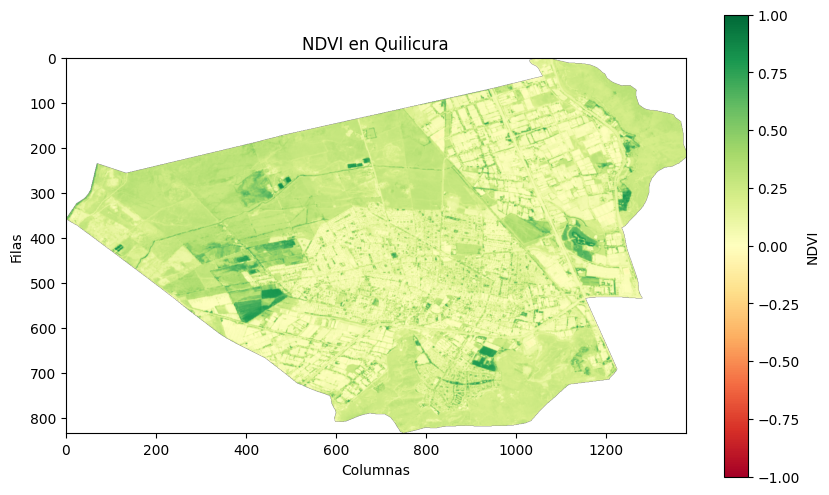

In [1]:
# cargar tif de ndvi
import rasterio
# Cargar el archivo NDVI exportado
ndvi_filepath = 'quilicura_ndvi.tif'  # Ajusta según el nombre del archivo exportado
ndvi_image = rasterio.open(ndvi_filepath)
# Leer los datos NDVI
ndvi_data = ndvi_image.read(1)  # Leer la primera banda (NDVI)
# Cerrar el archivo
ndvi_image.close()
# Visualizar el NDVI usando matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.imshow(ndvi_data, cmap='RdYlGn', vmin=-1, vmax=1)
plt.colorbar(label='NDVI')
plt.title('NDVI en Quilicura')
plt.xlabel('Columnas')
plt.ylabel('Filas')
plt.show()


In [5]:
import rasterio
with rasterio.open("Quilicura_NDVI_20231201_20240331.tif") as src:
    print(src.crs)
    print(src.bounds)

EPSG:32719
BoundingBox(left=332170.0, bottom=6303790.0, right=343660.0, top=6312150.0)


### Visualizar NDVI con políogono de Quilicura

Reproyectando Quilicura_NDVI_20231201_20240331.tif a ndvi_4326_reprojected_for_folium.tif (EPSG:4326)...
Reproyección a ndvi_4326_reprojected_for_folium.tif completada exitosamente.
Cargando y procesando ndvi_4326_reprojected_for_folium.tif para visualización en Folium...
Imagen PNG de NDVI guardada en: ndvi_rgb_overlay.png
Obteniendo polígono de Quilicura de OSMnx...
Polígono de Quilicura obtenido y listo para visualizar.
Creando mapa en Folium...



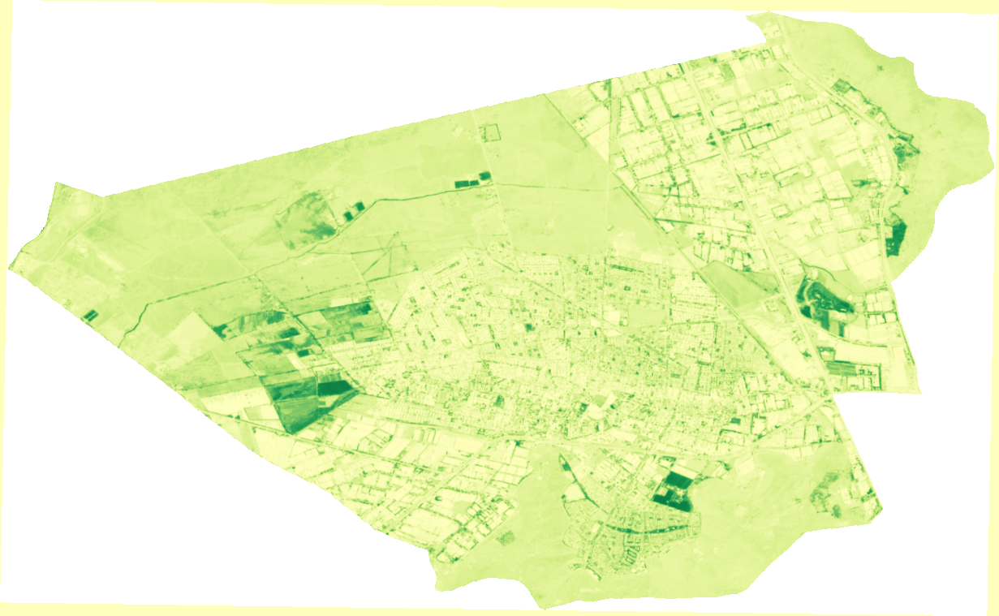

In [6]:
import folium
import geopandas as gpd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image # Necesaria para Pillow

# --- PASO 1: Reproyectar el GeoTIFF a EPSG:4326 ---
# Este es el archivo que obtuviste de GEE, que está en EPSG:32719
src_path = 'Quilicura_NDVI_20231201_20240331.tif'
# Este será el archivo reproyectado a EPSG:4326
dst_path_4326 = 'ndvi_4326_reprojected_for_folium.tif'

print(f"Reproyectando {src_path} a {dst_path_4326} (EPSG:4326)...")
try:
    with rasterio.open(src_path) as src:
        dst_crs = 'EPSG:4326'
        
        # Calcular la transformación para la reproyección
        # Considera usar Resampling.bilinear para una visualización más suave
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )
        
        # Actualizar los metadatos para el nuevo archivo
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height,
            'nodata': src.nodata # Mantener el valor nodata original
        })

        with rasterio.open(dst_path_4326, 'w', **kwargs) as dst:
            reproject(
                source=rasterio.band(src, 1), # NDVI tiene una sola banda
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.bilinear # Cambiado a bilinear para suavidad
            )
    print(f"Reproyección a {dst_path_4326} completada exitosamente.")
except FileNotFoundError:
    print(f"Error: No se encontró el archivo fuente '{src_path}'. Asegúrate de que el nombre sea correcto.")
    exit()
except Exception as e:
    print(f"Error durante la reproyección: {e}")
    exit()

# --- PASO 2: Cargar y procesar el NDVI reproyectado para Folium ---
tif_path_for_display = dst_path_4326 # Usamos el archivo reproyectado

print(f"Cargando y procesando {tif_path_for_display} para visualización en Folium...")
try:
    with rasterio.open(tif_path_for_display) as src:
        # Lee la banda de NDVI
        ndvi_data = src.read(1)
        
        # Obtener los límites del ráster reproyectado (ya en EPSG:4326)
        bounds_4326 = src.bounds 
        
        # Máscara de NoData y/o valores inválidos
        # Importante: Rasterio lee automáticamente el NoData si está en los metadatos.
        # Si no hay NoData definido en los metadatos, np.isnan es un buen respaldo.
        if src.nodata is not None:
            ndvi_masked = np.ma.masked_equal(ndvi_data, src.nodata)
        else:
            ndvi_masked = np.ma.masked_invalid(ndvi_data) # Enmascarar NaN e Inf

    # --- Normalizar NDVI [-1,1] a [0,1] ---
    # np.clip asegura que los valores estén dentro del rango esperado [-1, 1]
    ndvi_clipped = np.clip(ndvi_masked, -1, 1)
    ndvi_norm = (ndvi_clipped + 1) / 2

    # --- Aplicar colormap RdYlGn ---
    cmap = plt.get_cmap('RdYlGn')
    # Convertir a RGBA, luego a RGB (quitando el canal alfa)
    # .filled(0) reemplaza los valores enmascarados con 0 ANTES de aplicar el colormap
    ndvi_rgb = cmap(ndvi_norm.filled(0))[:, :, :3]

    # --- Crear fondo blanco donde no hay datos (pixels enmascarados) ---
    # Esto usa la máscara original del NDVI para aplicar el blanco
    if np.ma.is_masked(ndvi_masked): # Si el array es un masked array
        ndvi_rgb[ndvi_masked.mask] = [1, 1, 1] # Pinta de blanco los píxeles enmascarados

    # --- Guardar como imagen PNG (sin canal alfa) ---
    image_path_png = 'ndvi_rgb_overlay.png'
    # Convertir de float [0,1] a uint8 [0,255] para PIL
    ndvi_img_pil = Image.fromarray((ndvi_rgb * 255).astype(np.uint8))
    ndvi_img_pil.save(image_path_png)
    print(f"Imagen PNG de NDVI guardada en: {image_path_png}")

except FileNotFoundError:
    print(f"Error: No se encontró el archivo '{tif_path_for_display}'. Asegúrate de que el nombre sea correcto.")
    exit()
except Exception as e:
    print(f"Error durante el procesamiento del NDVI para Folium: {e}")
    exit()

# --- PASO 3: Obtener el polígono de Quilicura (para referencia en el mapa) ---
print("Obteniendo polígono de Quilicura de OSMnx...")
try:
    place_gdf = ox.geocode_to_gdf("Quilicura, Santiago, Chile")
    quilicura_polygon = place_gdf.geometry.iloc[0]
    gdf_quilicura = gpd.GeoDataFrame(geometry=[quilicura_polygon], crs="EPSG:4326")
    print("Polígono de Quilicura obtenido y listo para visualizar.")
except Exception as e:
    print(f"Error al obtener el polígono de Quilicura con OSMnx: {e}")
    print("El mapa se centrará en el NDVI, pero el contorno de Quilicura no se mostrará.")
    gdf_quilicura = None

# --- PASO 4: Crear y mostrar el mapa en Folium ---
print("Creando mapa en Folium...")

# Definir los límites de la imagen para Folium ImageOverlay
# Folium espera: [[min_lat, min_lon], [max_lat, max_lon]]
image_bounds_folium = [[bounds_4326.bottom, bounds_4326.left], [bounds_4326.top, bounds_4326.right]]

# Calcular el centro del mapa para un buen zoom inicial
center_lat = (bounds_4326.top + bounds_4326.bottom) / 2
center_lon = (bounds_4326.left + bounds_4326.right) / 2

m = folium.Map(location=[center_lat, center_lon], zoom_start=12) 

from folium.raster_layers import ImageOverlay # Importación explícita

ImageOverlay(
    name='NDVI Overlay', # Nombre más descriptivo
    image=image_path_png,
    bounds=image_bounds_folium,
    opacity=0.7,
    interactive=True,
    cross_origin=False
).add_to(m)

# Añadir el polígono de Quilicura si se obtuvo
if gdf_quilicura is not None:
    # __geo_interface__ asegura compatibilidad
    folium.GeoJson(gdf_quilicura.__geo_interface__, name="Límites de Quilicura").add_to(m)

folium.LayerControl().add_to(m)

# Mostrar el mapa (en un entorno Jupyter)
m

### Clasificación del suelo

In [ ]:
# # Paso 1: Clasificación con manejo de NaN
# def classify_ndvi(ndvi):
#     if np.isnan(ndvi):
#         return -1  # Clase para NaN (sin datos)
#     elif ndvi < 0.2:
#         return 0  # Suelo desnudo
#     elif ndvi < 0.5:
#         return 1  # Vegetación escasa
#     else:
#         return 2  # Vegetación densa

Reproyectando Quilicura_NDVI_20231201_20240331.tif a ndvi_4326_reprojected_for_folium.tif (EPSG:4326)...
Reproyección a ndvi_4326_reprojected_for_folium.tif completada exitosamente.
Cargando ndvi_4326_reprojected_for_folium.tif para aplicar la clasificación NDVI...
NDVI data loaded. Shape: (759, 1231), Bounds: BoundingBox(left=-70.80449614538512, bottom=-33.393780085145465, right=-70.67951293426326, top=-33.31671895009957)
No 'nodata' value defined in raster metadata. Proceeding without specific nodata handling.
Aplicando clasificación personalizada al NDVI...
NDVI classification applied. Result shape: (759, 1231)
NDVI classification masked array created. Masked pixels: 369511
Generando imagen PNG de clasificación con transparencia para Folium...
Imagen PNG de clasificación NDVI con transparencia guardada en: quilicura_ndvi_classified_overlay_rgba.png
Creando mapa en Folium con la clasificación NDVI transparente...



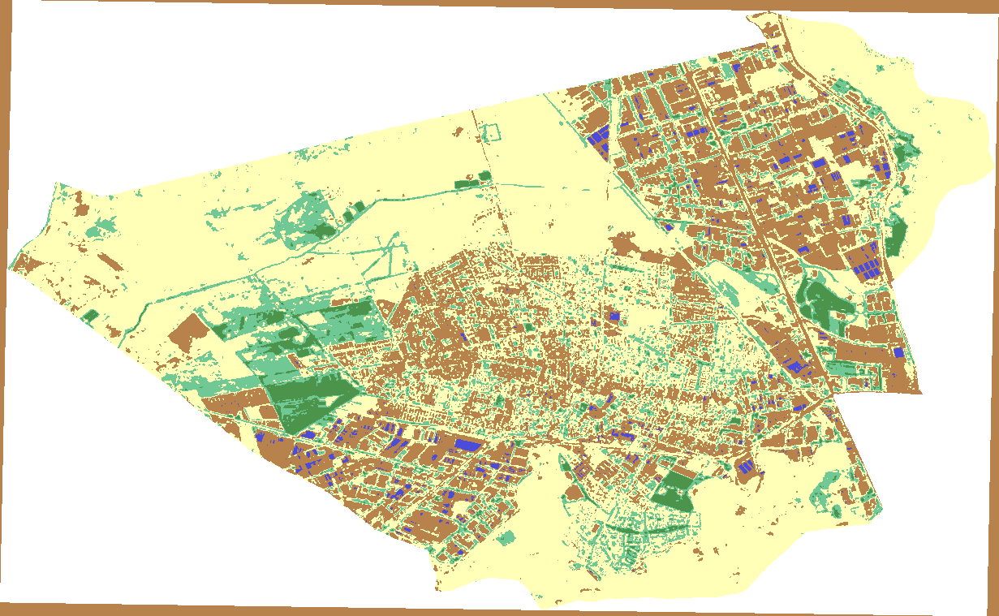

In [20]:
import folium
import geopandas as gpd
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image # Necesaria para Pillow

# --- PASO 1: Reproyectar el GeoTIFF de NDVI a EPSG:4326 ---
src_path_utm = 'Quilicura_NDVI_20231201_20240331.tif'
dst_path_4326 = 'ndvi_4326_reprojected_for_folium.tif'

print(f"Reproyectando {src_path_utm} a {dst_path_4326} (EPSG:4326)...")
try:
    with rasterio.open(src_path_utm) as src:
        dst_crs = 'EPSG:4326'
        
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )
        
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height,
            'nodata': src.nodata 
        })

        with rasterio.open(dst_path_4326, 'w', **kwargs) as dst:
            reproject(
                source=rasterio.band(src, 1),
                destination=rasterio.band(dst, 1),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.bilinear
            )
    print(f"Reproyección a {dst_path_4326} completada exitosamente.")
except FileNotFoundError:
    print(f"ERROR: No se encontró el archivo fuente '{src_path_utm}'. Asegúrate de que el nombre sea correcto y la ruta sea accesible.")
    raise FileNotFoundError(f"Archivo de origen no encontrado: {src_path_utm}") # Detener ejecución
except Exception as e:
    print(f"ERROR CRÍTICO durante la reproyección del NDVI: {e}")
    raise RuntimeError(f"Fallo en el PASO 1 (Reproyección): {e}") # Detener ejecución

# ... (previous code) ...

# --- PASO 2: Cargar el NDVI reproyectado y aplicar la clasificación ---
tif_path_for_classification = dst_path_4326

# Inicializar variables a None antes del try/except
ndvi_classification_masked = None
bounds_4326 = None 

print(f"Cargando {tif_path_for_classification} para aplicar la clasificación NDVI...")
try:
    with rasterio.open(tif_path_for_classification) as ndvi_src:
        ndvi_data = ndvi_src.read(1) 
        bounds_4326 = ndvi_src.bounds
        print(f"NDVI data loaded. Shape: {ndvi_data.shape}, Bounds: {bounds_4326}")

        if ndvi_src.nodata is not None:
           ndvi_data = np.copy(ndvi_data) 
           ndvi_data[ndvi_data == ndvi_src.nodata] = np.nan
           print(f"NoData value {ndvi_src.nodata} handled. Converted to NaN.")
        else:
           print("No 'nodata' value defined in raster metadata. Proceeding without specific nodata handling.")
        
        def classify_ndvi(value):
            if np.isnan(value):
                return np.nan 
            elif value < 0:
                return 1
            elif 0 <= value < 0.1:
                return 2
            elif 0.1 <= value < 0.25:
                return 3
            elif 0.25 <= value < 0.5:
                return 4
            else: 
                return 5

        print("Aplicando clasificación personalizada al NDVI...")
        # CRUCIAL CHANGE HERE: Specify otypes=[float] to allow NaN in output
        ndvi_classification = np.vectorize(classify_ndvi, otypes=[float])(ndvi_data)
        print(f"NDVI classification applied. Result shape: {ndvi_classification.shape}")
        
        ndvi_classification_masked = np.ma.masked_invalid(ndvi_classification)
        print(f"NDVI classification masked array created. Masked pixels: {ndvi_classification_masked.mask.sum()}")

except FileNotFoundError:
    print(f"CRITICAL ERROR: El archivo '{tif_path_for_classification}' no fue encontrado en el Paso 2.")
    raise FileNotFoundError(f"Archivo de clasificación no encontrado: {tif_path_for_classification}")
except Exception as e:
    print(f"ERROR CRÍTICO: Ocurrió un error inesperado al cargar o clasificar el ráster en el Paso 2: {e}")
    raise RuntimeError(f"Fallo en el PASO 2 (Carga/Clasificación): {e}")

# --- PASO 3: Definir el mapa de colores para la clasificación NDVI con ALPHA ---
# Ahora es un diccionario que mapea la clase a un color RGBA (0-1)
# El cuarto valor es el canal alfa (transparencia), donde 0 es completamente transparente y 1 es completamente opaco.
# Puedes ajustar la transparencia de cada clase.
ndvi_classification_colormap_rgba = {
    1: [0.0, 0.0, 0.8, 0.7],  # Clase 1: Agua/Nubes (Azul oscuro, 70% opaco)
    2: [0.6, 0.3, 0.0, 0.7],  # Clase 2: Suelo desnudo/Urbano (Marrón, 70% opaco)
    3: [1.0, 1.0, 0.6, 0.7],  # Clase 3: Vegetación escasa (Amarillo pálido, 70% opaco)
    4: [0.2, 0.7, 0.4, 0.7],  # Clase 4: Vegetación moderada (Verde mar medio, 70% opaco)
    5: [0.0, 0.4, 0.0, 0.7]   # Clase 5: Vegetación densa (Verde bosque oscuro, 70% opaco)
}

# --- PASO 4: Crear la imagen RGBA clasificada para Folium ---
print("Generando imagen PNG de clasificación con transparencia para Folium...")

# Crear un array RGBA vacío del mismo tamaño (Alto, Ancho, 4 canales) y tipo float
# Usamos float temporalmente para los valores 0-1 antes de escalar a 0-255
classified_rgba_image = np.zeros((ndvi_classification_masked.shape[0], 
                                  ndvi_classification_masked.shape[1], 4), dtype=np.float32)

# Rellenar la imagen RGBA con los colores de la clasificación
# Usa el colormap_rgba definido en el PASO 3
for class_val, rgba_color in ndvi_classification_colormap_rgba.items():
    mask_for_class = (ndvi_classification_masked == class_val)
    if mask_for_class.any(): 
        classified_rgba_image[mask_for_class] = rgba_color

# Para las áreas que son NoData (NaN en ndvi_classification_masked), establecer el canal alfa a 0 (transparente)
if np.ma.is_masked(ndvi_classification_masked):
    # Asegúrate de que las áreas enmascaradas sean completamente transparentes
    classified_rgba_image[ndvi_classification_masked.mask] = [0.0, 0.0, 0.0, 0.0] # RGB 0, Alpha 0

# Convertir de float [0,1] a uint8 [0,255] para PIL
# Esto es CRUCIAL para que PIL.Image.fromarray funcione correctamente
classified_img_pil = Image.fromarray((classified_rgba_image * 255).astype(np.uint8), 'RGBA')

image_path_classified_png = 'quilicura_ndvi_classified_overlay_rgba.png' # Nuevo nombre de archivo
classified_img_pil.save(image_path_classified_png)
print(f"Imagen PNG de clasificación NDVI con transparencia guardada en: {image_path_classified_png}")

# --- PASO 6: Crear el mapa en Folium ---
print("Creando mapa en Folium con la clasificación NDVI transparente...")

image_bounds_folium = [[bounds_4326.bottom, bounds_4326.left], [bounds_4326.top, bounds_4326.right]]
center_lat = (bounds_4326.top + bounds_4326.bottom) / 2
center_lon = (bounds_4326.left + bounds_4326.right) / 2

m = folium.Map(location=[center_lat, center_lon], zoom_start=12) 

from folium.raster_layers import ImageOverlay 

ImageOverlay(
    name='Clasificación NDVI (Transparente)', # Nuevo nombre para diferenciar
    image=image_path_classified_png,
    bounds=image_bounds_folium,
    opacity=1.0, # La transparencia se maneja en el PNG, así que la opacidad aquí es 1.0 (opaco)
    interactive=True,
    cross_origin=False
).add_to(m)

if gdf_quilicura is not None:
    folium.GeoJson(gdf_quilicura.__geo_interface__, name="Límites de Quilicura").add_to(m)

if buildings_heights_gpf is not None:
    geojson_data = buildings_heights_gpf.dropna(subset=['geometry']).__geo_interface__

folium.GeoJson(
    geojson_data,
    name='Edificios',
    style_function=lambda feature: {
        'fillColor': 'blue',
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.4
    }
).add_to(m)

folium.LayerControl().add_to(m)

m

In [21]:
# save the map to an HTML file
map_html_path = 'quilicura_ndvi_classification_map.html'
m.save(map_html_path)
print(f"Mapa guardado en: {map_html_path}")

Mapa guardado en: quilicura_ndvi_classification_map.html


In [ ]:
# import folium
# import geopandas as gpd
# import rasterio
# from rasterio.warp import calculate_default_transform, reproject, Resampling
# import numpy as np
# import matplotlib.pyplot as plt
# from PIL import Image # Necesaria para Pillow

# # --- PASO 1: Reproyectar el GeoTIFF de NDVI a EPSG:4326 ---
# src_path_utm = 'Quilicura_NDVI_20231201_20240331.tif'
# dst_path_4326 = 'ndvi_4326_reprojected_for_folium.tif'

# print(f"Reproyectando {src_path_utm} a {dst_path_4326} (EPSG:4326)...")
# try:
#     with rasterio.open(src_path_utm) as src:
#         dst_crs = 'EPSG:4326'
        
#         transform, width, height = calculate_default_transform(
#             src.crs, dst_crs, src.width, src.height, *src.bounds
#         )
        
#         kwargs = src.meta.copy()
#         kwargs.update({
#             'crs': dst_crs,
#             'transform': transform,
#             'width': width,
#             'height': height,
#             'nodata': src.nodata 
#         })

#         with rasterio.open(dst_path_4326, 'w', **kwargs) as dst:
#             reproject(
#                 source=rasterio.band(src, 1),
#                 destination=rasterio.band(dst, 1),
#                 src_transform=src.transform,
#                 src_crs=src.crs,
#                 dst_transform=transform,
#                 dst_crs=dst_crs,
#                 resampling=Resampling.bilinear
#             )
#     print(f"Reproyección a {dst_path_4326} completada exitosamente.")
# except FileNotFoundError:
#     print(f"ERROR: No se encontró el archivo fuente '{src_path_utm}'. Asegúrate de que el nombre sea correcto y la ruta sea accesible.")
#     raise FileNotFoundError(f"Archivo de origen no encontrado: {src_path_utm}") # Detener ejecución
# except Exception as e:
#     print(f"ERROR CRÍTICO durante la reproyección del NDVI: {e}")
#     raise RuntimeError(f"Fallo en el PASO 1 (Reproyección): {e}") # Detener ejecución

# # ... (previous code) ...

# # --- PASO 2: Cargar el NDVI reproyectado y aplicar la clasificación ---
# tif_path_for_classification = dst_path_4326

# # Inicializar variables a None antes del try/except
# ndvi_classification_masked = None
# bounds_4326 = None 

# print(f"Cargando {tif_path_for_classification} para aplicar la clasificación NDVI...")
# try:
#     with rasterio.open(tif_path_for_classification) as ndvi_src:
#         ndvi_data = ndvi_src.read(1) 
#         bounds_4326 = ndvi_src.bounds
#         print(f"NDVI data loaded. Shape: {ndvi_data.shape}, Bounds: {bounds_4326}")

#         if ndvi_src.nodata is not None:
#            ndvi_data = np.copy(ndvi_data) 
#            ndvi_data[ndvi_data == ndvi_src.nodata] = np.nan
#            print(f"NoData value {ndvi_src.nodata} handled. Converted to NaN.")
#         else:
#            print("No 'nodata' value defined in raster metadata. Proceeding without specific nodata handling.")
        
#         def classify_ndvi(value):
#             if np.isnan(value):
#                 return np.nan 
#             elif value < 0:
#                 return 1
#             elif 0 <= value < 0.1:
#                 return 2
#             elif 0.1 <= value < 0.25:
#                 return 3
#             elif 0.25 <= value < 0.5:
#                 return 4
#             else: 
#                 return 5

#         print("Aplicando clasificación personalizada al NDVI...")
#         # CRUCIAL CHANGE HERE: Specify otypes=[float] to allow NaN in output
#         ndvi_classification = np.vectorize(classify_ndvi, otypes=[float])(ndvi_data)
#         print(f"NDVI classification applied. Result shape: {ndvi_classification.shape}")
        
#         ndvi_classification_masked = np.ma.masked_invalid(ndvi_classification)
#         print(f"NDVI classification masked array created. Masked pixels: {ndvi_classification_masked.mask.sum()}")

# except FileNotFoundError:
#     print(f"CRITICAL ERROR: El archivo '{tif_path_for_classification}' no fue encontrado en el Paso 2.")
#     raise FileNotFoundError(f"Archivo de clasificación no encontrado: {tif_path_for_classification}")
# except Exception as e:
#     print(f"ERROR CRÍTICO: Ocurrió un error inesperado al cargar o clasificar el ráster en el Paso 2: {e}")
#     raise RuntimeError(f"Fallo en el PASO 2 (Carga/Clasificación): {e}")

# # --- PASO 3: Definir el mapa de colores para la clasificación NDVI ---
# # ndvi_classification_colormap = {
# #     1: [0, 0, 200],      # Clase 1: Agua/Nubes (Azul oscuro)
# #     2: [160, 82, 45],    # Clase 2: Suelo desnudo/Urbano (Marrón)
# #     3: [255, 255, 150],  # Clase 3: Vegetación escasa (Amarillo pálido)
# #     4: [60, 179, 113],   # Clase 4: Vegetación moderada (Verde mar medio)
# #     5: [0, 100, 0]       # Clase 5: Vegetación densa (Verde bosque oscuro)
# # }

# ndvi_classification_colormap = {
#     1: [0, 0, 200],      # Clase 1: Agua/Nubes (Azul oscuro)
#     2: [160, 82, 45],    # Clase 2: Suelo desnudo/Urbano (Marrón)
#     3: [255, 255, 150],  # Clase 3: Vegetación escasa (Amarillo pálido)
#     4: [60, 179, 113],   # Clase 4: Vegetación moderada (Verde mar medio)
#     5: [0, 100, 0]       # Clase 5: Vegetación densa (Verde bosque oscuro)
# }

# # --- PASO 4: Crear la imagen RGB clasificada para Folium ---
# print("Generando imagen PNG de clasificación para Folium...")
# classified_rgb_image = np.zeros((ndvi_classification_masked.shape[0], 
#                                  ndvi_classification_masked.shape[1], 3), dtype=np.uint8)

# for class_val, rgb_color in ndvi_classification_colormap.items():
#     mask_for_class = (ndvi_classification_masked == class_val)
#     if mask_for_class.any(): 
#         classified_rgb_image[mask_for_class] = rgb_color

# if np.ma.is_masked(ndvi_classification_masked):
#     classified_rgb_image[ndvi_classification_masked.mask] = [255, 255, 255] # Blanco

# image_path_classified_png = 'quilicura_ndvi_classified_overlay.png'
# classified_img_pil = Image.fromarray(classified_rgb_image)
# classified_img_pil.save(image_path_classified_png)
# print(f"Imagen PNG de clasificación NDVI guardada en: {image_path_classified_png}")

# # --- PASO 5: Obtener el polígono de Quilicura (para referencia en el mapa) ---
# print("Obteniendo polígono de Quilicura de OSMnx...")
# try:
#     place_gdf = ox.geocode_to_gdf("Quilicura, Santiago, Chile")
#     quilicura_polygon = place_gdf.geometry.iloc[0]
#     gdf_quilicura = gpd.GeoDataFrame(geometry=[quilicura_polygon], crs="EPSG:4326")
#     print("Polígono de Quilicura obtenido y listo para visualizar.")
# except Exception as e:
#     print(f"Error al obtener el polígono de Quilicura con OSMnx: {e}")
#     print("El mapa se centrará en el NDVI, pero el contorno de Quilicura no se mostrará.")
#     gdf_quilicura = None

# # --- PASO 6: Crear el mapa en Folium ---
# print("Creando mapa en Folium con la clasificación NDVI...")

# image_bounds_folium = [[bounds_4326.bottom, bounds_4326.left], [bounds_4326.top, bounds_4326.right]]
# center_lat = (bounds_4326.top + bounds_4326.bottom) / 2
# center_lon = (bounds_4326.left + bounds_4326.right) / 2

# m = folium.Map(location=[center_lat, center_lon], zoom_start=12) 

# from folium.raster_layers import ImageOverlay 

# ImageOverlay(
#     name='Clasificación NDVI',
#     image=image_path_classified_png,
#     bounds=image_bounds_folium,
#     opacity=0.7, 
#     interactive=True,
#     cross_origin=False
# ).add_to(m)

# if gdf_quilicura is not None:
#     folium.GeoJson(gdf_quilicura.__geo_interface__, name="Límites de Quilicura").add_to(m)

# folium.LayerControl().add_to(m)

# m

In [22]:
ndvi_classification_masked

masked_array(
  data=[[2.0, 2.0, 2.0, ..., 2.0, 2.0, 2.0],
        [2.0, 2.0, 2.0, ..., 2.0, 2.0, 2.0],
        [2.0, 2.0, 2.0, ..., 2.0, 2.0, 2.0],
        ...,
        [2.0, 2.0, 2.0, ..., 2.0, 2.0, 2.0],
        [2.0, 2.0, 2.0, ..., 2.0, 2.0, 2.0],
        [2.0, 2.0, 2.0, ..., 2.0, 2.0, 2.0]],
  mask=[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],
  fill_value=1e+20)

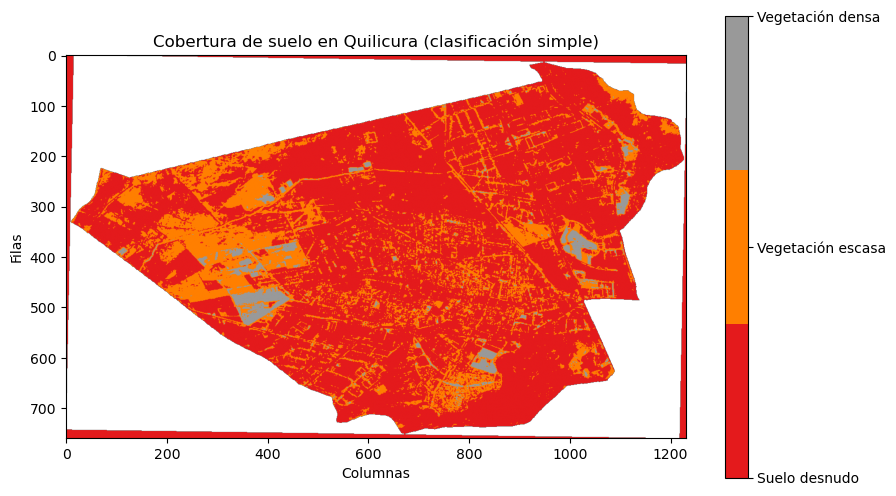


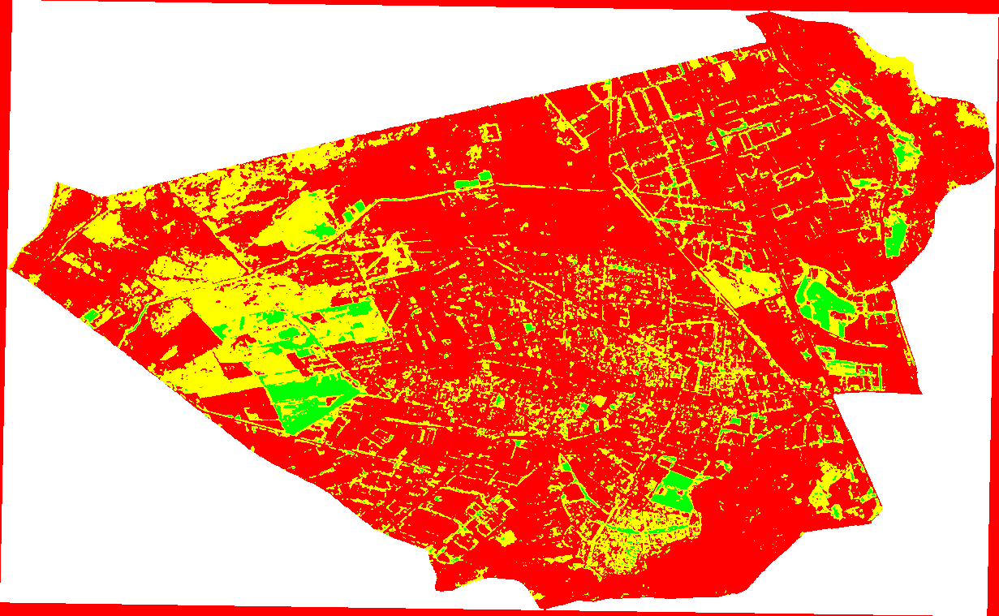

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import folium
import rasterio
from rasterio.transform import from_origin
import os

# Simulación de NDVI (reemplaza esto por tus datos reales)
# ndvi_data = np.random.rand(100, 100)
# Simula algunos NaN
# ndvi_data[ndvi_data < 0.1] = np.nan

# Paso 1: Clasificación con manejo de NaN
def classify_ndvi(ndvi):
    if np.isnan(ndvi):
        return -1  # Clase para NaN (sin datos)
    elif ndvi < 0.2:
        return 0  # Suelo desnudo
    elif ndvi < 0.5:
        return 1  # Vegetación escasa
    else:
        return 2  # Vegetación densa

# Aplicar clasificación
ndvi_classification = np.vectorize(classify_ndvi)(ndvi_data)

# Paso 2: Visualización estática
cmap = plt.get_cmap('Set1', 3)
labels = ['Suelo desnudo', 'Vegetación escasa', 'Vegetación densa']

plt.figure(figsize=(10, 6))
im = plt.imshow(np.ma.masked_where(ndvi_classification == -1, ndvi_classification), cmap=cmap, vmin=0, vmax=2)
cbar = plt.colorbar(im, ticks=[0, 1, 2])
cbar.ax.set_yticklabels(labels)
plt.title('Cobertura de suelo en Quilicura (clasificación simple)')
plt.xlabel('Columnas')
plt.ylabel('Filas')
plt.show()

# Paso 3: Exportar como GeoTIFF (para usarlo en folium como superposición)
# Define resolución y esquina superior izquierda del raster (ajústalo según tu área real)
transform = from_origin(-70.75, -33.35, 0.0001, 0.0001)  # long, lat, pixel_size_x, pixel_size_y
output_tif = "ndvi_classification.tif"

with rasterio.open(
    output_tif,
    "w",
    driver="GTiff",
    height=ndvi_classification.shape[0],
    width=ndvi_classification.shape[1],
    count=1,
    dtype=rasterio.int16,
    crs="EPSG:4326",
    transform=transform,
) as dst:
    dst.write(ndvi_classification.astype(rasterio.int16), 1)

# Paso 4: Mapa interactivo con folium
m = folium.Map(location=[-33.36, -70.73], zoom_start=13)

# Añadir capa raster (necesitas tener 'ndvi_classification.tif' servido por un servidor o usar localmente con folium.plugins.ImageOverlay)
from folium.raster_layers import ImageOverlay

# Cargar los datos raster para obtener el rango
with rasterio.open(output_tif) as src:
    bounds = src.bounds
    img_data = src.read(1)

image_overlay = ImageOverlay(
    image=img_data,
    bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
    colormap=lambda x: {
        -1: (0, 0, 0, 0),    # Transparente para NaN
         0: (1, 0, 0, 0.5),   # Rojo para Suelo desnudo
         1: (1, 1, 0, 0.5),   # Amarillo para Vegetación escasa
         2: (0, 1, 0, 0.5)    # Verde para Vegetación densa
    }.get(int(x), (0, 0, 0, 0)),
    opacity=0.6,
    interactive=True,
    cross_origin=False,
    name="NDVI Classification"
)

image_overlay.add_to(m)

folium.LayerControl().add_to(m)
m


In [33]:
# export shapefile
buildings_heights_gpf.to_file("buildings_heights_quilicura.shp", driver='ESRI Shapefile')

C:\Users\cj_li\AppData\Local\Temp\ipykernel_24408\4029506884.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  buildings_heights_gpf.to_file("buildings_heights_quilicura.shp", driver='ESRI Shapefile')
c:\Users\cj_li\anaconda3\envs\ox\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'original_osm_id' to 'original_o'
  ogr_write(


Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría: IllegalArgumentException: Points of LinearRing do not form a closed linestring
Error al traducir geometría:

C:\Users\cj_li\AppData\Local\Temp\ipykernel_24408\687120371.py:78: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


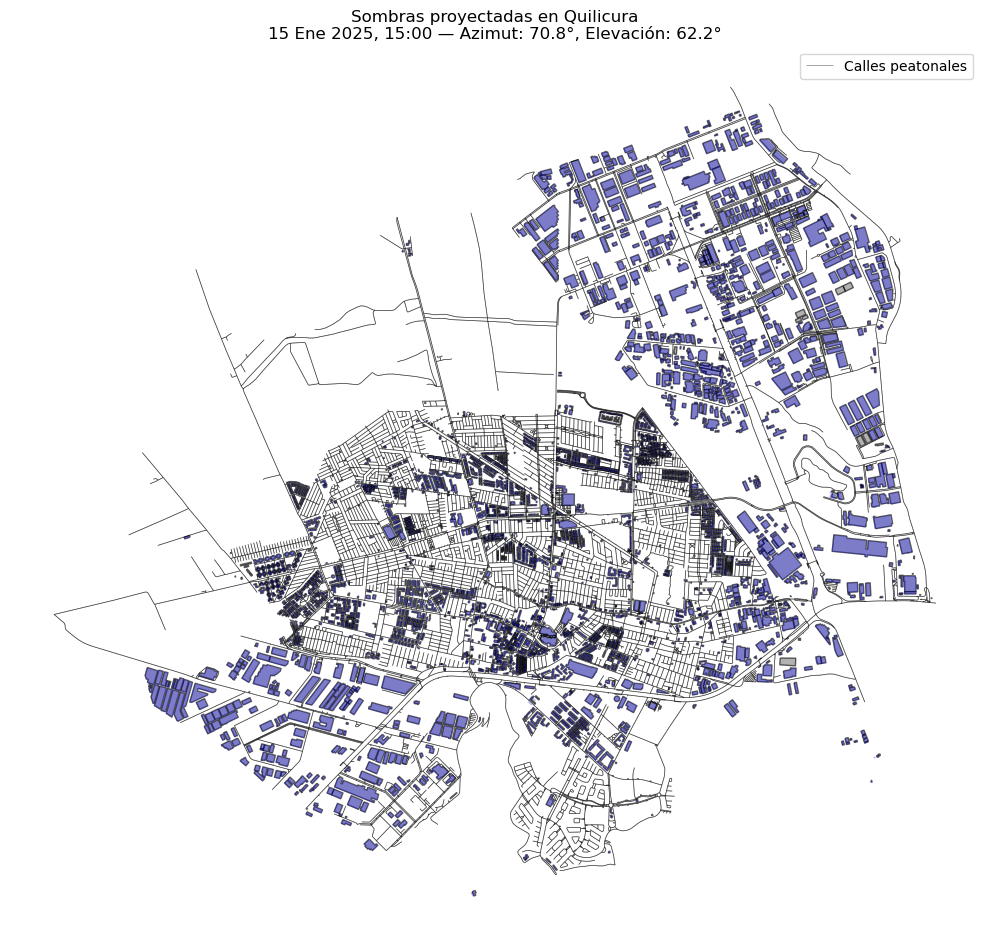

In [32]:
import osmnx as ox
import geopandas as gpd
from shapely.affinity import translate
from shapely.geometry import Polygon, MultiPolygon
import matplotlib.pyplot as plt
from datetime import datetime
import pvlib
import numpy as np

# 1. Definir lugar y obtener grafo
place_name = "Quilicura, Santiago, Chile"
G = ox.graph_from_place(place_name, network_type="walk")

# 2. Usar buildings_heights_gpf como entrada
buildings = buildings_heights_gpf.copy()

# 3. Validar geometrías y reproyectar a coordenadas métricas
buildings = buildings[buildings.geometry.notnull()]
buildings = buildings[buildings.geometry.type.isin(["Polygon", "MultiPolygon"])]

# Reparar geometrías inválidas
buildings["geometry"] = buildings["geometry"].apply(lambda geom: geom.buffer(0) if not geom.is_valid else geom)
buildings = buildings[buildings.is_valid]

# Reproyectar
buildings = buildings.to_crs(epsg=32719)

# 4. Validar columna de altura
if "mean" not in buildings.columns:
    raise ValueError("La columna 'mean' no existe en buildings_heights_gpf.")

# 5. Obtener posición solar
latitude, longitude = -33.36, -70.73
dt = datetime(2025, 1, 15, 15, 0, 0)  # Verano austral, 15:00

solpos = pvlib.solarposition.get_solarposition(time=dt, latitude=latitude, longitude=longitude).iloc[0]
elevation = solpos.elevation
azimuth = solpos.azimuth

if elevation <= 0:
    raise ValueError("El sol está bajo el horizonte, no hay sombras proyectadas.")

# 6. Calcular dirección y longitud de sombra
shadow_angle_rad = np.radians((azimuth + 180) % 360)
shadow_length = buildings["mean"] / np.tan(np.radians(elevation))

# 7. Generar sombras
shadow_geoms = []

for geom, length in zip(buildings.geometry, shadow_length):
    try:
        dx = length * np.sin(shadow_angle_rad)
        dy = length * np.cos(shadow_angle_rad)
        shadow = translate(geom, xoff=dx, yoff=dy)
        if shadow.is_valid:
            shadow_geoms.append(shadow)
        else:
            print("Sombra inválida descartada.")
    except Exception as e:
        print(f"Error al traducir geometría: {e}")
        continue

# Crear GeoDataFrame con sombras válidas
shadows = gpd.GeoDataFrame(geometry=shadow_geoms, crs=buildings.crs)

# 8. Preparar grafo para superponer
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_edges = gdf_edges.to_crs(buildings.crs)

# 9. Plotear resultado
fig, ax = plt.subplots(figsize=(10, 10))
buildings.plot(ax=ax, facecolor="gray", edgecolor="black", alpha=0.6, label="Edificios")
shadows.plot(ax=ax, facecolor="blue", edgecolor=None, alpha=0.3, label="Sombras")
gdf_edges.plot(ax=ax, color="black", linewidth=0.5, alpha=0.5, label="Calles peatonales")

plt.title(f"Sombras proyectadas en Quilicura\n15 Ene 2025, 15:00 — Azimut: {azimuth:.1f}°, Elevación: {elevation:.1f}°")
plt.axis("off")
plt.legend()
plt.tight_layout()
plt.show()


In [28]:
import osmnx as ox
import geopandas as gpd
from shapely.affinity import translate
from shapely.geometry import Polygon
import matplotlib.pyplot as plt
from datetime import datetime
import pvlib
import numpy as np

# 1. Definir lugar y obtener datos
place_name = "Quilicura, Santiago, Chile"
G = ox.graph_from_place(place_name, network_type="walk")
#buildings = ox.features_from_place(place_name, tags={"building": True})

# Filtrar edificios con geometría válida
# buildings = buildings[buildings.geometry.type.isin(["Polygon", "MultiPolygon"])]
buildings = buildings_heights_gpf.to_crs(epsg=32719)  # Proyección métrica para manipulación de distancias (WGS 84 / UTM zone 19S)
#buildings_heights_gpf

# 2. Estimar altura de edificios (si no hay atributo)
estimated_height = 10  # metros
buildings["mean"] = buildings.get("mean", estimated_height)

# 3. Obtener posición solar
latitude, longitude = -33.36, -70.73
dt = datetime(2025, 1, 15, 15, 0, 0)  # día soleado de verano, 15:00

solpos = pvlib.solarposition.get_solarposition(time=dt, latitude=latitude, longitude=longitude).iloc[0]
elevation = solpos.elevation
azimuth = solpos.azimuth

# Si el sol está muy bajo, no habrá sombras útiles
if elevation <= 0:
    raise ValueError("El sol está bajo el horizonte, no hay sombras proyectadas.")

# 4. Calcular dirección y longitud de sombra
shadow_angle_rad = np.radians((azimuth + 180) % 360)
shadow_length = buildings["mean"] / np.tan(np.radians(elevation))

from shapely.geometry import Polygon, MultiPolygon

# Eliminar geometrías vacías o no poligonales
buildings = buildings[buildings.geometry.notnull()]
buildings = buildings[buildings.geometry.type.isin(["Polygon", "MultiPolygon"])]

# Arreglar geometrías inválidas (ej. aros no cerrados)
buildings["geometry"] = buildings["geometry"].buffer(0)

# (Opcional) solo mantener geometrías válidas
# buildings = buildings[buildings.is_valid]

# 5. Generar geometrías de sombra desplazando los polígonos
shadow_geoms = []

for geom, length in zip(buildings.geometry, shadow_length):
    dx = length * np.sin(shadow_angle_rad)
    dy = length * np.cos(shadow_angle_rad)
    shadow = translate(geom, xoff=dx, yoff=dy)
    shadow_geoms.append(shadow)

# Crear GeoDataFrame con sombras
shadows = gpd.GeoDataFrame(geometry=shadow_geoms, crs=buildings.crs)

# 6. Preparar grafo para superponer
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_edges = gdf_edges.to_crs(buildings.crs)

# 7. Plotear resultado
fig, ax = plt.subplots(figsize=(10, 10))
buildings.plot(ax=ax, facecolor="gray", edgecolor="black", alpha=0.6, label="Edificios")
shadows.plot(ax=ax, facecolor="blue", edgecolor=None, alpha=0.3, label="Sombras")
gdf_edges.plot(ax=ax, color="black", linewidth=0.5, alpha=0.5, label="Calles peatonales")

plt.title(f"Sombras proyectadas en Quilicura\n15 Ene 2025, 15:00 — Azimut: {azimuth:.1f}°, Elevación: {elevation:.1f}°")
plt.axis("off")
plt.legend()
plt.tight_layout()
plt.show()


GEOSException: IllegalArgumentException: Points of LinearRing do not form a closed linestring

In [ ]:
print(buildings.dtypes)

In [ ]:
buildings['height'].isna().sum()# = buildings['height'].astype(float)

In [ ]:
import pandas as pd

# Asumiendo que 'height' es la columna con alturas (puede ser 'building:levels' o similar)
if 'height' in buildings.columns:
    buildings['height'] = pd.to_numeric(buildings['height'], errors='coerce')
else:
    # Si no hay altura, asignamos una altura estándar, p.ej 10 m
    buildings['height'] = 10

In [ ]:
import osmnx as ox
import geopandas as gpd
from shapely.affinity import translate
from shapely.geometry import Polygon
import matplotlib.pyplot as plt
from datetime import datetime
import pvlib
import numpy as np